In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
#importanto librerías necesarias
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os

In [3]:
#instalando la librería ultralytics
!pip install ultralytics

# Preparando el dataset

In [4]:
# rutas de las imágenes
train_path  = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
test_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
val_path  = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'

In [5]:
#se crean tres listas (train, test y val) con todas las imágenes (archivos que acaban con extensión jpg)
train_images = [image for image in os.listdir(train_path) if image[-3:] =='jpg' ]
test_images = [image for image in os.listdir(test_path) if image[-3:] =='jpg' ]
val_images = [image for image in os.listdir(val_path) if image[-3:] =='jpg' ]
len(train_images),len(test_images),len(val_images)

(1502, 215, 429)

In [6]:
import glob
import os
#Se usa la librería glob para buscar todos los archivos con extensión json que tendrán las
#etiquetas. Se almacenan en tres listas
train_annotations = glob.glob(os.path.join(train_path, '*.json'))
test_annotations = glob.glob(os.path.join(test_path, '*.json'))
val_annotations = glob.glob(os.path.join(val_path, '*.json'))


In [7]:
import json
#se procesan los json
train_annotations = json.load(open(train_annotations[0]))
test_annotations = json.load(open(test_annotations[0]))
val_annotations = json.load(open(val_annotations[0]))

In [8]:
import json
import os
import shutil

def convert_and_organize_coco_to_yolo(annotations, images_dir, output_images_dir, output_labels_dir):
    """
    Convierte anotaciones en formato COCO a formato YOLO y organiza las imágenes y etiquetas.

    Args:
        json_file (str): Ruta al archivo JSON con anotaciones en formato COCO.
        images_dir (str): Carpeta donde están las imágenes originales.
        output_images_dir (str): Carpeta destino para las imágenes organizadas.
        output_labels_dir (str): Carpeta destino para las etiquetas organizadas.
    """
    # Crear las carpetas de salida si no existen
    os.makedirs(output_images_dir, exist_ok=True)
    os.makedirs(output_labels_dir, exist_ok=True)

    # Cargar las anotaciones desde el archivo JSON

    # Procesar las anotaciones
    for annotation in annotations['annotations']:
        # Extraer información de la anotación
        image_id = annotation['image_id']
        bbox = annotation['bbox']
        
        # Buscar la imagen correspondiente
        image_info = next(img for img in annotations['images'] if img['id'] == image_id)
        file_name = image_info['file_name']
        image_width = image_info['width']
        image_height = image_info['height']
        
        # Normalizar las coordenadas de la caja delimitadora
        x_center = (bbox[0] + bbox[2] / 2) / image_width
        y_center = (bbox[1] + bbox[3] / 2) / image_height
        width = bbox[2] / image_width
        height = bbox[3] / image_height
        
        # Crear el archivo de etiquetas en formato YOLO
        label_path = os.path.join(output_labels_dir, file_name.replace('.jpg', '.txt'))
        with open(label_path, 'a') as f:
            f.write(f"0 {x_center} {y_center} {width} {height}\n")
        
        # Copiar la imagen al directorio de salida
        src_image_path = os.path.join(images_dir, file_name)
        dest_image_path = os.path.join(output_images_dir, file_name)
        shutil.copy(src_image_path, dest_image_path)


In [9]:
# Adaptando los datasets a yolo
train_image_dir = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/train/'
val_image_dir = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/valid/'
test_image_dir = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
convert_and_organize_coco_to_yolo(
    train_annotations,
    images_dir=train_image_dir,
    output_images_dir='dataset/images/train/',
    output_labels_dir='dataset/labels/train/'
)

convert_and_organize_coco_to_yolo(
    val_annotations,
    images_dir=val_image_dir,
    output_images_dir='dataset/images/val/',
    output_labels_dir='dataset/labels/val/'
)

convert_and_organize_coco_to_yolo(
    test_annotations,
    images_dir=test_image_dir,
    output_images_dir='dataset/images/test/',
    output_labels_dir='dataset/labels/test/'
)


# Entrenamiento de Yolo

In [12]:
from ultralytics import YOLO
model = YOLO("yolo11n.pt")  

results = model.train(data="/kaggle/input/yolo-dataset/dataset.yml", epochs=100, imgsz=640)

Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/input/yolo-dataset/dataset.yml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_co

train: Scanning /kaggle/working/dataset/labels/train.cache... 1501 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1501/1501 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/dataset/labels/val.cache... 429 images, 0 backgrounds, 0 corrupt: 100%|██████████| 429/429 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.71G      1.775       3.36      1.711         17        640: 100%|██████████| 94/94 [00:21<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.04it/s]


                   all        429        429      0.162       0.31      0.119     0.0555

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.69G      1.712      2.451      1.717         23        640: 100%|██████████| 94/94 [00:19<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.22it/s]

                   all        429        429      0.359      0.275      0.258      0.108



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.69G      1.732      2.072      1.776         22        640: 100%|██████████| 94/94 [00:19<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.49it/s]

                   all        429        429      0.624      0.459      0.514      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.69G      1.702      1.841      1.748         23        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.14it/s]

                   all        429        429      0.622      0.534      0.579      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.68G      1.663      1.665      1.713         13        640: 100%|██████████| 94/94 [00:19<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.21it/s]

                   all        429        429      0.701      0.613      0.654      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.68G      1.651      1.639      1.687         26        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.96it/s]

                   all        429        429       0.68      0.524      0.607      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.69G      1.597      1.514      1.673         25        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.29it/s]

                   all        429        429      0.752      0.587      0.688      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.68G      1.611      1.562      1.675         22        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.10it/s]

                   all        429        429      0.717       0.59      0.675       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.68G        1.6      1.474      1.667         25        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.08it/s]

                   all        429        429       0.62      0.548      0.613      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.68G      1.576      1.404      1.631         17        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.12it/s]

                   all        429        429      0.766      0.625       0.73      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.68G       1.55      1.393      1.619         18        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.25it/s]

                   all        429        429      0.801      0.686      0.796      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.68G       1.52      1.362      1.621         15        640: 100%|██████████| 94/94 [00:19<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.27it/s]

                   all        429        429      0.768      0.602      0.703      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.68G      1.543      1.304      1.608         22        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.70it/s]

                   all        429        429      0.735       0.66      0.731      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.69G      1.547       1.34      1.604         19        640: 100%|██████████| 94/94 [00:19<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.07it/s]

                   all        429        429      0.682      0.622      0.679      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.68G      1.512      1.304      1.589         20        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.22it/s]

                   all        429        429      0.819      0.719      0.817      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.68G      1.501      1.258      1.578         23        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.27it/s]

                   all        429        429      0.811      0.723      0.819      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.68G      1.504      1.256      1.574         17        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.15it/s]

                   all        429        429      0.741      0.599      0.713      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.68G      1.476      1.218      1.559         16        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.14it/s]

                   all        429        429      0.799      0.667       0.78      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.68G      1.501      1.249      1.586         19        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.21it/s]

                   all        429        429      0.822      0.697       0.81      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.68G      1.482      1.198      1.569         18        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.28it/s]

                   all        429        429      0.775      0.627      0.712      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      3.68G      1.484      1.175      1.564         24        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.37it/s]

                   all        429        429      0.833      0.727      0.843      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.68G      1.476      1.188      1.551         15        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.21it/s]

                   all        429        429      0.851      0.734      0.835      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.68G      1.439      1.133      1.556         27        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.78it/s]

                   all        429        429      0.802      0.774      0.853      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.68G      1.462      1.147      1.549         22        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.41it/s]

                   all        429        429      0.851      0.759      0.854      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.68G      1.435       1.14      1.535         16        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.32it/s]

                   all        429        429      0.871      0.695      0.841      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.68G      1.441        1.1      1.537         16        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.26it/s]

                   all        429        429      0.801      0.783      0.863      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.68G      1.411      1.129      1.514         18        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.33it/s]

                   all        429        429      0.845      0.727      0.832      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.68G      1.416       1.08      1.508         19        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.33it/s]

                   all        429        429      0.849      0.776      0.864       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.68G      1.411      1.066      1.506         21        640: 100%|██████████| 94/94 [00:19<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.32it/s]

                   all        429        429      0.859       0.72      0.844        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.68G      1.425      1.062      1.522         24        640: 100%|██████████| 94/94 [00:19<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.19it/s]

                   all        429        429      0.836      0.739      0.845      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.68G      1.372       1.05      1.485         22        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.30it/s]

                   all        429        429       0.83      0.772      0.854      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.68G       1.41      1.044      1.508         15        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.28it/s]

                   all        429        429      0.816      0.723      0.833      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.68G      1.386      1.032      1.515         18        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.61it/s]

                   all        429        429      0.845      0.735      0.851      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.68G      1.392      1.012      1.492         24        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.23it/s]

                   all        429        429      0.796      0.771      0.863      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.68G      1.396      1.029      1.504         24        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.43it/s]

                   all        429        429      0.816      0.774      0.865      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.68G      1.384      1.029      1.507         16        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.31it/s]

                   all        429        429      0.739      0.784      0.829      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.68G      1.359     0.9629      1.469         17        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.32it/s]

                   all        429        429      0.813       0.79      0.864      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.68G      1.374     0.9769      1.473         25        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.33it/s]

                   all        429        429      0.821      0.747      0.856      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      3.68G       1.35     0.9543      1.473         22        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.37it/s]

                   all        429        429      0.825      0.755       0.84      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.68G      1.343     0.9591      1.459         14        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.38it/s]

                   all        429        429      0.841      0.779       0.87      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.68G      1.343     0.9355      1.451         19        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.16it/s]

                   all        429        429      0.853      0.755      0.868      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.68G      1.334     0.9285      1.449         26        640: 100%|██████████| 94/94 [00:19<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.26it/s]

                   all        429        429      0.876      0.732      0.868      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.68G      1.331     0.9076      1.458         18        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.62it/s]

                   all        429        429      0.875      0.753      0.872        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.68G      1.342     0.8946       1.45         24        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.39it/s]

                   all        429        429      0.816      0.797       0.86      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.68G      1.317     0.8943      1.423         25        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.48it/s]

                   all        429        429      0.855      0.784      0.867      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.68G      1.309     0.8994      1.432         17        640: 100%|██████████| 94/94 [00:19<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.34it/s]

                   all        429        429      0.847      0.784      0.886       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.68G      1.317     0.8953      1.439         26        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.30it/s]

                   all        429        429      0.849      0.786      0.885      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.68G      1.306     0.8879      1.431         17        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.30it/s]

                   all        429        429      0.838      0.786      0.876      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.68G      1.292     0.8641      1.425         20        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.38it/s]

                   all        429        429      0.832      0.822       0.88      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.68G      1.285     0.8612      1.413         23        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.36it/s]

                   all        429        429      0.848      0.797      0.882      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.68G      1.295     0.8859       1.43         25        640: 100%|██████████| 94/94 [00:19<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.30it/s]

                   all        429        429      0.821      0.825      0.883      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      3.68G      1.274       0.87      1.415         21        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.35it/s]

                   all        429        429      0.853      0.741      0.858      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.68G      1.283      0.843      1.407         16        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.77it/s]

                   all        429        429      0.837      0.818      0.885      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.68G      1.289      0.855      1.409         17        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.27it/s]

                   all        429        429      0.828      0.797      0.875      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.68G      1.219     0.8221      1.366         19        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.39it/s]

                   all        429        429      0.858      0.804        0.9      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.68G      1.274     0.8344      1.408         24        640: 100%|██████████| 94/94 [00:19<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.28it/s]

                   all        429        429       0.84      0.806      0.881       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.68G      1.265     0.8117      1.393         19        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.18it/s]

                   all        429        429      0.871      0.783      0.889      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.68G      1.252      0.823      1.382         18        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.44it/s]

                   all        429        429      0.879      0.821      0.901      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.68G      1.229     0.7976      1.364         18        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.24it/s]

                   all        429        429      0.857      0.804      0.894      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.68G      1.271     0.8352      1.388         28        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.40it/s]

                   all        429        429       0.83      0.829      0.888      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      3.68G      1.252     0.8179      1.368         27        640: 100%|██████████| 94/94 [00:19<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.46it/s]

                   all        429        429      0.871      0.795      0.894      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.68G      1.212     0.8032      1.356         20        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.25it/s]

                   all        429        429      0.851      0.836      0.898      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.68G      1.215     0.7768      1.344         28        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.63it/s]

                   all        429        429      0.865      0.818      0.896      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.68G      1.214     0.7726      1.346         21        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.28it/s]

                   all        429        429      0.825      0.841      0.886      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      3.68G      1.202     0.7784      1.347         21        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.40it/s]

                   all        429        429      0.856       0.82      0.899      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.68G      1.203     0.7599      1.332         24        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.44it/s]

                   all        429        429      0.855      0.832      0.902      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.68G      1.185     0.7429      1.335         21        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.28it/s]

                   all        429        429      0.875      0.817      0.893      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.68G      1.192      0.768      1.332         25        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.43it/s]

                   all        429        429      0.856      0.832      0.909      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.68G      1.185     0.7366      1.326         30        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.37it/s]

                   all        429        429      0.868      0.831      0.899      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      3.68G      1.168     0.7392      1.329         22        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.51it/s]

                   all        429        429      0.854      0.848      0.894      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      3.68G      1.158     0.7353      1.316         21        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.25it/s]

                   all        429        429      0.829      0.884      0.911      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.68G      1.178     0.7412      1.307         21        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.22it/s]

                   all        429        429      0.863      0.839      0.901       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.68G      1.157     0.7179      1.303         27        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.90it/s]

                   all        429        429      0.838      0.855        0.9      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.68G      1.155     0.7235      1.308         25        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.35it/s]

                   all        429        429      0.891      0.841      0.909      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.68G      1.147     0.7025      1.306         23        640: 100%|██████████| 94/94 [00:19<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.44it/s]

                   all        429        429      0.859      0.867      0.903      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.68G      1.143     0.6977      1.298         23        640: 100%|██████████| 94/94 [00:19<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.40it/s]

                   all        429        429      0.831      0.858      0.887      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      3.68G      1.147     0.7298      1.292         21        640: 100%|██████████| 94/94 [00:19<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.20it/s]

                   all        429        429      0.878      0.848       0.92       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.68G      1.159     0.7051      1.307         25        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.38it/s]

                   all        429        429       0.88       0.86      0.913      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.68G      1.126     0.6952      1.293         16        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.33it/s]

                   all        429        429       0.86      0.842      0.903       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      3.68G      1.122     0.6841      1.289         23        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.37it/s]

                   all        429        429      0.869       0.86      0.911      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      3.68G      1.109     0.6784      1.273         17        640: 100%|██████████| 94/94 [00:19<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.29it/s]

                   all        429        429      0.859      0.854       0.91      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      3.68G      1.091      0.662      1.258         19        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.46it/s]

                   all        429        429      0.885       0.86      0.916      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.68G      1.113     0.6754      1.261         28        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.02it/s]

                   all        429        429      0.861      0.864      0.914      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.68G      1.102     0.6578      1.262         26        640: 100%|██████████| 94/94 [00:19<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.40it/s]

                   all        429        429      0.891      0.858       0.92      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.68G      1.082     0.6472      1.247         20        640: 100%|██████████| 94/94 [00:19<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.29it/s]

                   all        429        429      0.884      0.862      0.915      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      3.68G      1.083     0.6429      1.247         15        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.36it/s]

                   all        429        429      0.876      0.856       0.91      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      3.68G      1.077     0.6538      1.259         22        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.28it/s]

                   all        429        429      0.871      0.876      0.908      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      3.68G      1.088      0.655      1.254         25        640: 100%|██████████| 94/94 [00:19<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.42it/s]

                   all        429        429      0.873      0.876      0.923      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.68G      1.065     0.6464      1.236         26        640: 100%|██████████| 94/94 [00:19<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.32it/s]

                   all        429        429      0.867      0.881      0.913      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      3.68G      1.066     0.6323      1.239         29        640: 100%|██████████| 94/94 [00:19<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.26it/s]

                   all        429        429      0.858       0.89      0.916      0.568


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      3.68G      1.033     0.5153      1.242         13        640: 100%|██████████| 94/94 [00:20<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.36it/s]

                   all        429        429      0.862      0.856      0.899      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      3.68G     0.9826     0.4801      1.214         13        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.41it/s]

                   all        429        429      0.868      0.874      0.908      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      3.68G     0.9749     0.4746      1.202         13        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.79it/s]

                   all        429        429      0.875      0.861      0.909      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      3.68G     0.9549     0.4677      1.184         13        640: 100%|██████████| 94/94 [00:19<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.19it/s]

                   all        429        429      0.884      0.868      0.909      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      3.68G     0.9536     0.4645      1.191         13        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.46it/s]

                   all        429        429      0.875       0.88      0.917       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      3.68G     0.9563     0.4607      1.178         13        640: 100%|██████████| 94/94 [00:19<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.18it/s]

                   all        429        429      0.866      0.886      0.916      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      3.68G     0.9387     0.4569       1.17         13        640: 100%|██████████| 94/94 [00:19<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.38it/s]

                   all        429        429      0.864      0.873      0.914      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      3.68G     0.9345     0.4519      1.171         13        640: 100%|██████████| 94/94 [00:19<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.26it/s]

                   all        429        429      0.862      0.885       0.91      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      3.68G     0.9324     0.4583      1.167         13        640: 100%|██████████| 94/94 [00:19<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.42it/s]

                   all        429        429       0.88      0.869      0.913      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      3.68G     0.9229     0.4404      1.163         13        640: 100%|██████████| 94/94 [00:19<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.45it/s]

                   all        429        429      0.867      0.883      0.915      0.565



100 epochs completed in 0.628 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  3.88it/s]


                   all        429        429      0.866      0.887      0.916      0.569
Speed: 0.2ms preprocess, 2.0ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


In [13]:
# ruta de los archivos
post_training_files_path = '/kaggle/working/runs/detect/train/'

# ruta del modelo
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Se carga el modelo
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /kaggle/working/dataset/labels/val.cache... 429 images, 0 backgrounds, 0 corrupt: 100%|██████████| 429/429 [00:00<?, ?it/s]
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:03<00:00,  7.56it/s]


                   all        429        429      0.867      0.886      0.916      0.569
Speed: 0.2ms preprocess, 2.7ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


# Evaluación de yolo

In [15]:
import pandas as pd
# Se guardan en un dataframe las métricas
metrics = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

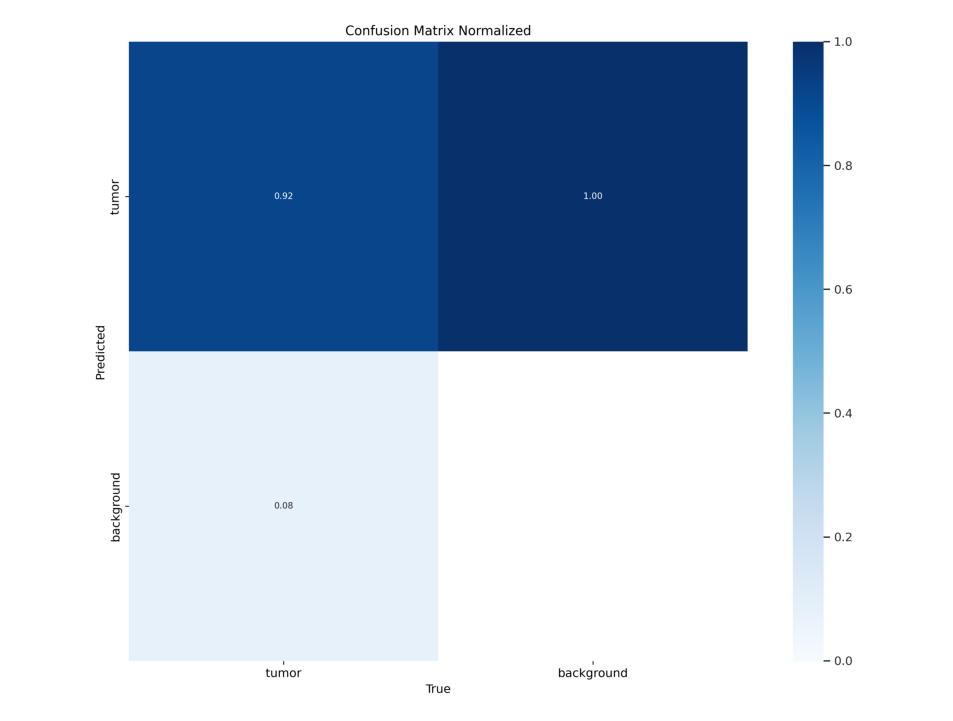

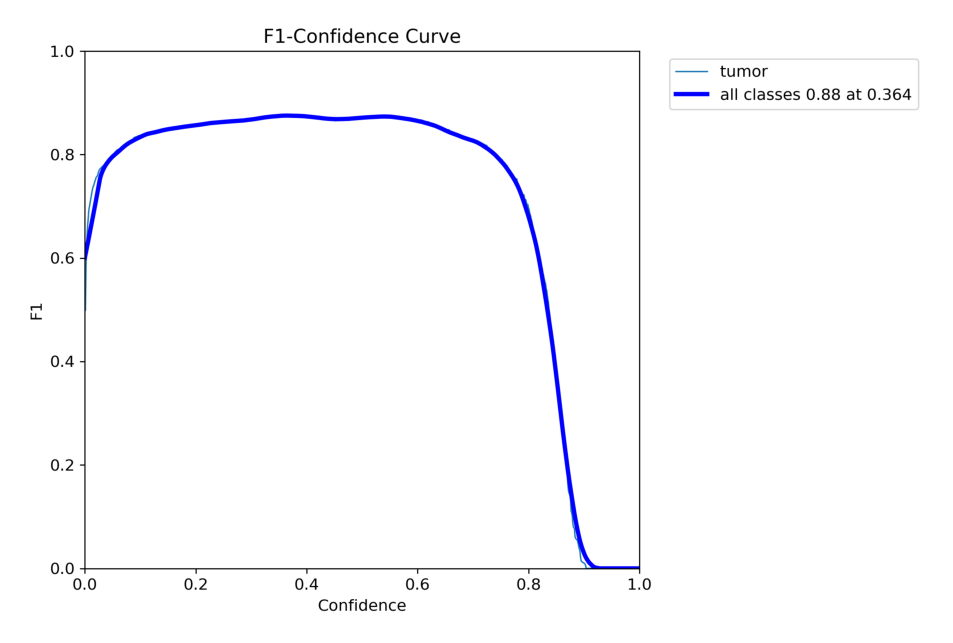

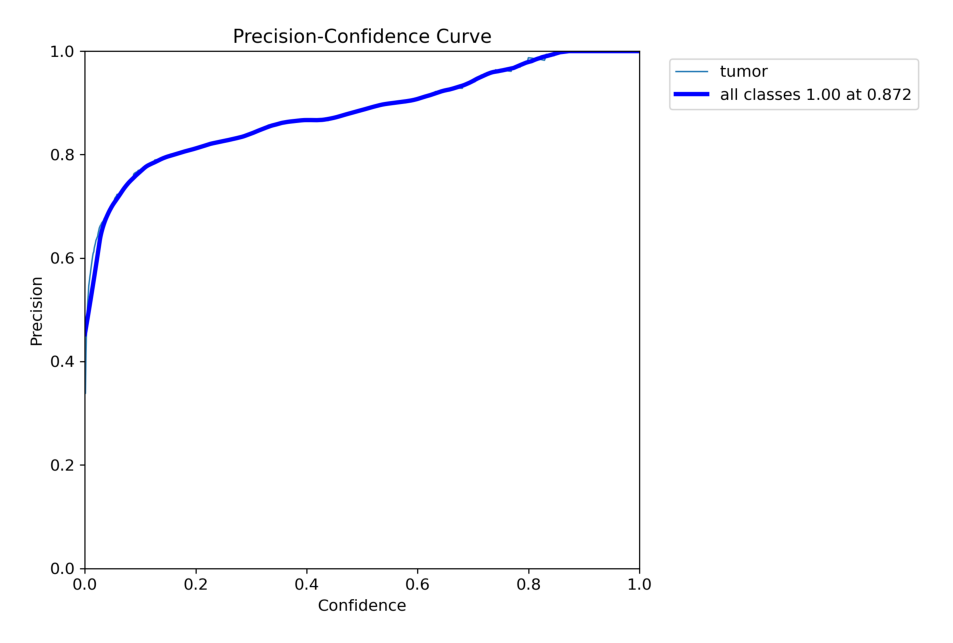

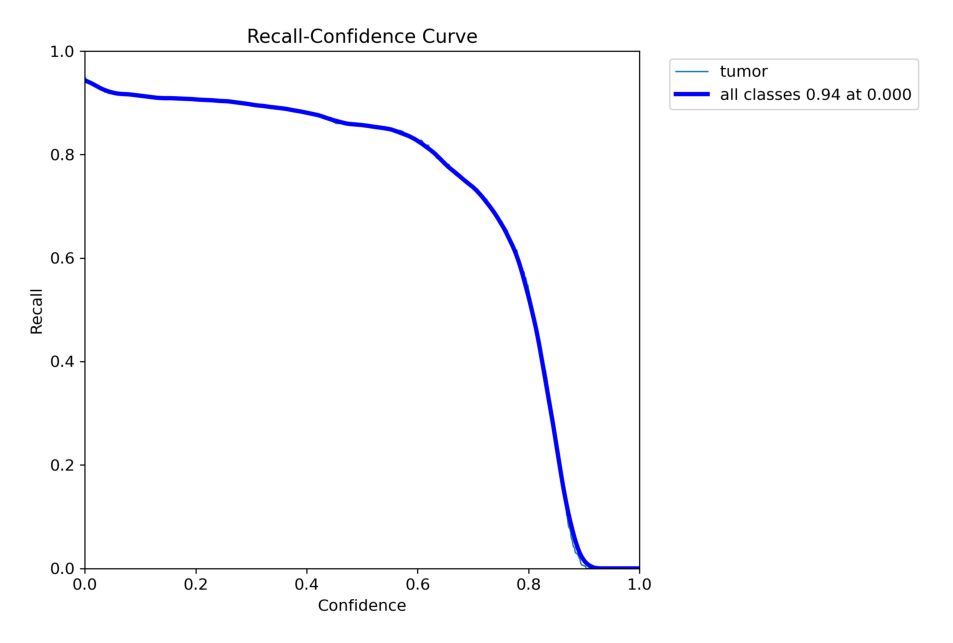

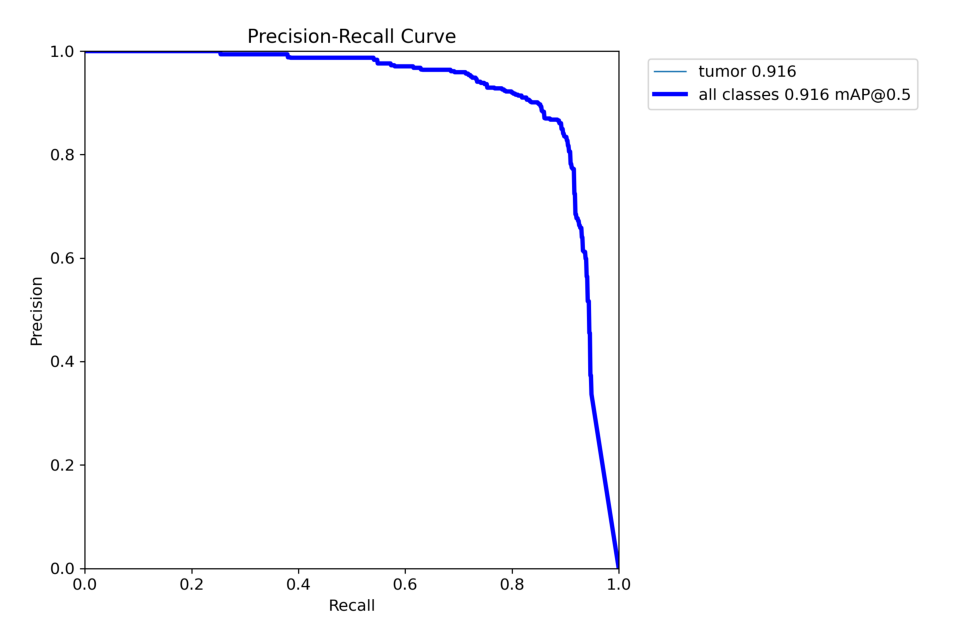

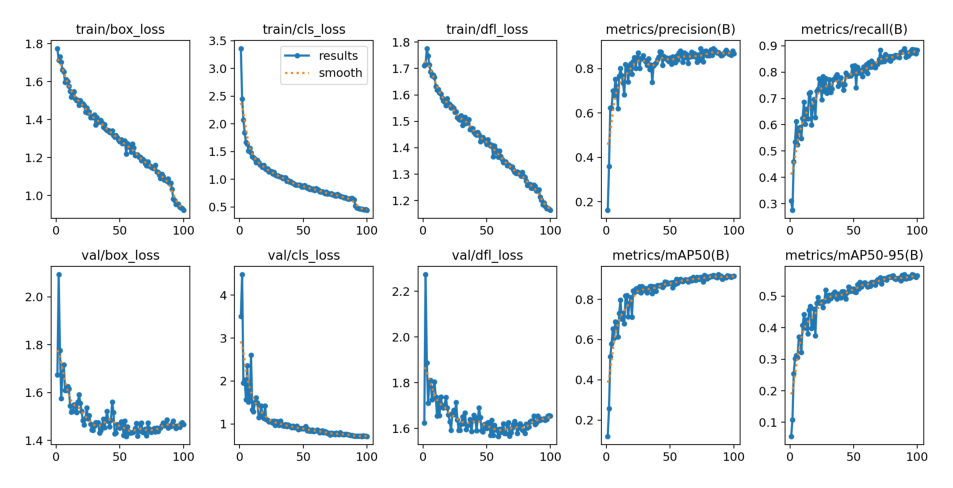

In [17]:
import seaborn as sns
# Se muestran las gráficas de las métricas de yolo
sns.set(rc={'axes.facecolor': '#9b63b8'}, style='darkgrid')

def display_images(post_training_files_path, image_files):
    
    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = '/kaggle/working/runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)


Mostrando 9 detecciones de yolo


0: 640x640 1 tumor, 10.4ms
Speed: 3.0ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.4ms
Speed: 1.6ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.5ms
Speed: 1.7ms preprocess, 8.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.6ms
Speed: 1.7ms preprocess, 8.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 tumors, 8.3ms
Speed: 1.7ms preprocess, 8.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.2ms
Speed: 1.6ms preprocess, 8.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.6ms
Speed: 1.7ms preprocess, 8.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.4ms
Speed: 2.0ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1

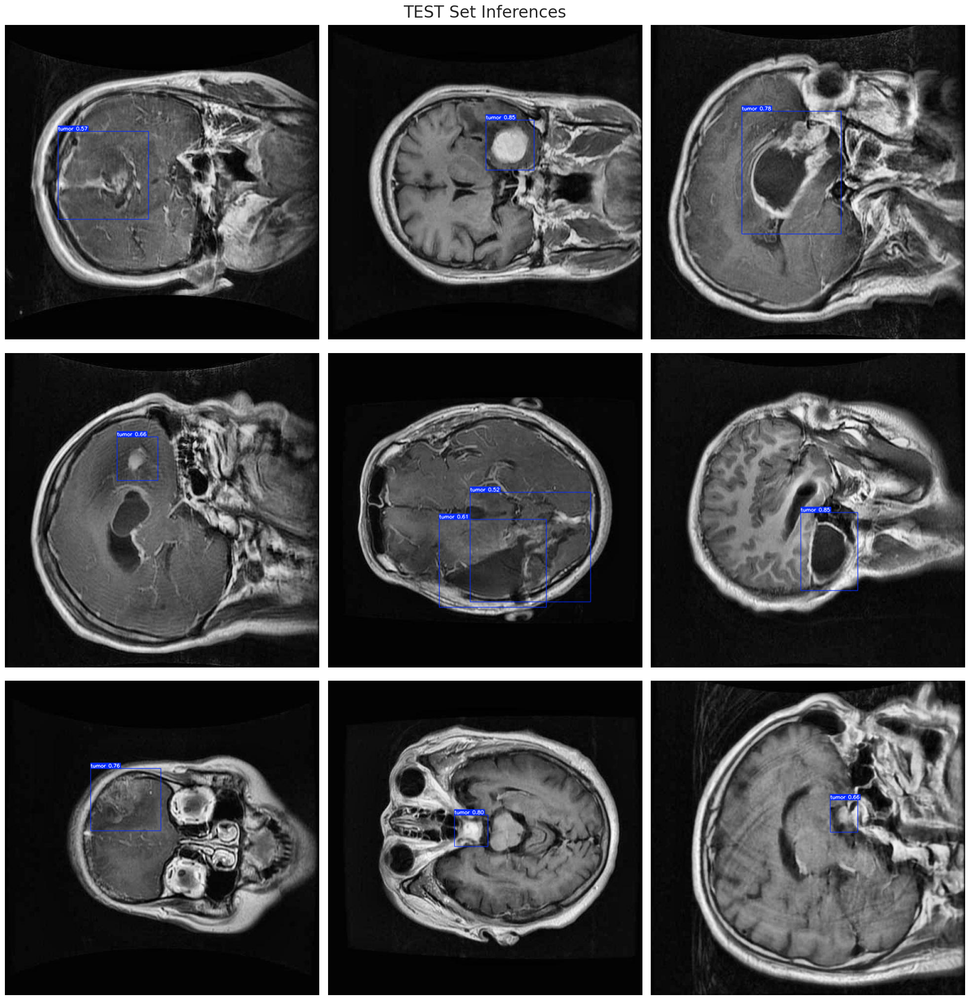

In [20]:
#normalizando imágenes
def normalize_image(image):
    return image / 255.0

# cambiando el tamaño de las imágenes
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# rutas del dataset
dataset_path = '/kaggle/working/dataset/images'  
valid_images_path = '/kaggle/working/dataset/images/test'

image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

#se comprueba que hay imágenes
if len(image_files) > 0:
    # Se seleccionan 9 imágnes
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  #
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('TEST Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = best_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()



0: 640x640 1 tumor, 14.5ms
Speed: 8.8ms preprocess, 14.5ms inference, 253.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.8ms
Speed: 2.5ms preprocess, 8.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 

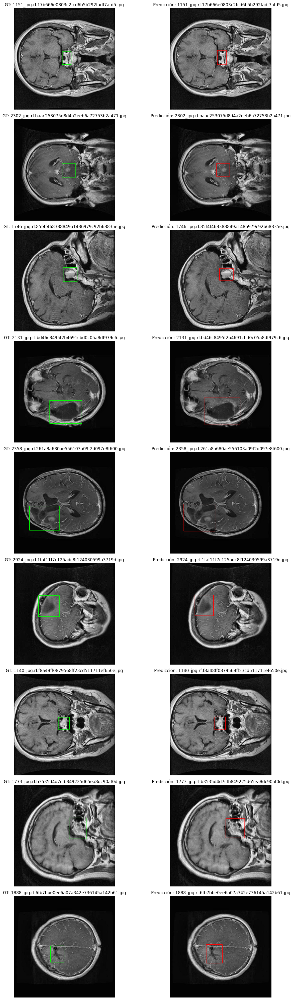

In [10]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Ruta al modelo entrenado
model_path = '/kaggle/input/runs-yolo/runs/detect/train/weights/best.pt'
model = YOLO(model_path)

# Función para normalizar la imagen
def normalize_image(image):
    return image / 255.0

# Función para redimensionar la imagen
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Rutas a las imágenes y etiquetas del conjunto de prueba
test_images_path = '/kaggle/working/dataset/images/test'
test_labels_path = '/kaggle/working/dataset/labels/test'

# Obtener lista de imágenes
image_files = [file for file in os.listdir(test_images_path) if file.endswith('.jpg')]

# Verificar que haya imágenes
if len(image_files) > 0:
    # Seleccionar 9 imágenes en intervalos iguales
    num_images = len(image_files)
    step_size = max(1, num_images // 9)
    selected_images = [image_files[i] for i in range(0, num_images, step_size)][:9]

    # Preparar subplots
    fig, axes = plt.subplots(9, 2, figsize=(15, 40))

    for idx, image_name in enumerate(selected_images):
        image_path = os.path.join(test_images_path, image_name)
        label_path = os.path.join(test_labels_path, image_name.replace('.jpg', '.txt'))

        # Cargar imagen
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = resize_image(image)

        # Copias de la imagen para anotaciones
        image_gt = image_resized.copy()
        image_pred = image_resized.copy()

        # 1. Dibujar bounding boxes de Ground Truth
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    class_id, x_center, y_center, width, height = map(float, line.strip().split())
                    img_h, img_w, _ = image_gt.shape
                    x_center *= img_w
                    y_center *= img_h
                    width *= img_w
                    height *= img_h
                    x1 = int(x_center - width / 2)
                    y1 = int(y_center - height / 2)
                    x2 = int(x_center + width / 2)
                    y2 = int(y_center + height / 2)
                    cv2.rectangle(image_gt, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Verde para GT

        # 2. Realizar predicción y dibujar bounding boxes
        results = model.predict(image_pred, imgsz=640, conf=0.5)
        for r in results:
            boxes = r.boxes.xyxy.tolist()
            for box in boxes:
                x1, y1, x2, y2 = map(int, box[:4])
                cv2.rectangle(image_pred, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Rojo para predicciones

        # Mostrar imágenes en subplots
        axes[idx, 0].imshow(image_gt)
        axes[idx, 0].set_title(f'GT: {image_name}')
        axes[idx, 0].axis('off')

        axes[idx, 1].imshow(image_pred)
        axes[idx, 1].set_title(f'Predicción: {image_name}')
        axes[idx, 1].axis('off')

    plt.tight_layout()
    plt.show()


0: 640x640 1 tumor, 10.3ms
Speed: 1.9ms preprocess, 10.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.7ms
Speed: 1.6ms preprocess, 8.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.4ms
Speed: 1.6ms preprocess, 8.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 tumors, 8.7ms
Speed: 1.7ms preprocess, 8.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 8.7ms
Speed: 1.6ms preprocess, 8.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 tumor, 9.4ms
Speed: 2.2ms preprocess, 9.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640

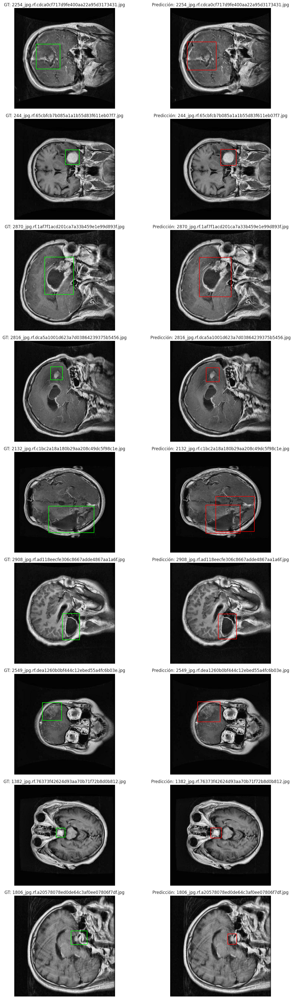

In [49]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Ruta al modelo entrenado
model_path = 'runs/detect/train/weights/best.pt'
model = YOLO(model_path)

# Función para normalizar la imagen
def normalize_image(image):
    return image / 255.0

# Función para redimensionar la imagen
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Rutas a las imágenes y etiquetas del conjunto de prueba
test_images_path = '/kaggle/working/dataset/images/test'
test_labels_path = '/kaggle/working/dataset/labels/test'

# Obtener lista de imágenes
image_files = [file for file in os.listdir(test_images_path) if file.endswith('.jpg')]

# Verificar que haya imágenes
if len(image_files) > 0:
    # Seleccionar 9 imágenes en intervalos iguales
    num_images = len(image_files)
    step_size = max(1, num_images // 9)
    selected_images = [image_files[i] for i in range(0, num_images, step_size)][:9]

    # Preparar subplots
    fig, axes = plt.subplots(9, 2, figsize=(15, 40))

    for idx, image_name in enumerate(selected_images):
        image_path = os.path.join(test_images_path, image_name)
        label_path = os.path.join(test_labels_path, image_name.replace('.jpg', '.txt'))

        # Cargar imagen
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = resize_image(image)

        # Copias de la imagen para anotaciones
        image_gt = image_resized.copy()
        image_pred = image_resized.copy()

        # 1. Dibujar bounding boxes de Ground Truth
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    class_id, x_center, y_center, width, height = map(float, line.strip().split())
                    img_h, img_w, _ = image_gt.shape
                    x_center *= img_w
                    y_center *= img_h
                    width *= img_w
                    height *= img_h
                    x1 = int(x_center - width / 2)
                    y1 = int(y_center - height / 2)
                    x2 = int(x_center + width / 2)
                    y2 = int(y_center + height / 2)
                    cv2.rectangle(image_gt, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Verde para GT

        # 2. Realizar predicción y dibujar bounding boxes
        results = model.predict(image_pred, imgsz=640, conf=0.5)
        for r in results:
            boxes = r.boxes.xyxy.tolist()
            for box in boxes:
                x1, y1, x2, y2 = map(int, box[:4])
                cv2.rectangle(image_pred, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Rojo para predicciones

        # Mostrar imágenes en subplots
        axes[idx, 0].imshow(image_gt)
        axes[idx, 0].set_title(f'GT: {image_name}')
        axes[idx, 0].axis('off')

        axes[idx, 1].imshow(image_pred)
        axes[idx, 1].set_title(f'Predicción: {image_name}')
        axes[idx, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Preparando los datos para los modelos U-net

In [10]:
def _train_masks():
    '''
    Función que crea las máscaras de cada imagen usando las coordenadas
    '''
    print('train masks')
    mask_dir = '/kaggle/working/train_masks/' #se crea un directorio donde se almacenan las máscaras
    os.makedirs(mask_dir, exist_ok=True)
    totalImages = len(train_annotations['images'])
    done = 0
    for img,ann in zip(train_annotations['images'],train_annotations['annotations']):
        path = train_path + img['file_name']
        mask_path = mask_dir + img['file_name']
        # load image in open cv
        image = cv2.imread(path)
        segmentation = ann['segmentation']
        #Se usan las coordenadas de la segmentación para hacer la máscara.
        #Con el reshape se crea un array de coordenadas
        segmentation = np.array(segmentation[0], dtype=np.int32).reshape(-1, 2)
        mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
        cv2.fillPoly(mask, [segmentation], color=(255,255,255))
        #Se guarda la máscara creada en el directorio
        cv2.imwrite(mask_path, mask)
        done+=1

def _test_masks():
    print('test masks')

    totalImages = len(test_annotations['images'])
    done = 0
    mask_dir = '/kaggle/working/test_masks/'
    os.makedirs(mask_dir, exist_ok=True)
    
    for img,ann in zip(test_annotations['images'],test_annotations['annotations']):
        path = test_path + img['file_name']
        mask_path = mask_dir + img['file_name']

        image = cv2.imread(path)
        segmentation = ann['segmentation']
        segmentation = np.array(segmentation[0], dtype=np.int32).reshape(-1, 2)
        mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
        cv2.fillPoly(mask, [segmentation], color=(255,255,255))
        cv2.imwrite(mask_path, mask)
        done+=1



def _val_masks():
    print('val masks')
    totalImages = len(val_annotations['images'])
    done = 0
    mask_dir = '/kaggle/working/val_masks/'
    os.makedirs(mask_dir, exist_ok=True)
    
    for img,ann in zip(val_annotations['images'],val_annotations['annotations']):
        path = val_path + img['file_name']
        mask_path = mask_dir + img['file_name']
        image = cv2.imread(path)
        segmentation = ann['segmentation']
        segmentation = np.array(segmentation[0], dtype=np.int32).reshape(-1, 2)
        mask = np.zeros((image.shape[0], image.shape[1]), dtype=np.uint8)
        cv2.fillPoly(mask, [segmentation], color=(255,255,255))
        cv2.imwrite(mask_path, mask)
        done+=1


from threading import Thread
def make_masks():
  '''
  Función que usa las tres funciones anteriores para crear las imágenes de las máscaras
  Se usa la función thread para crear las máscaras de train, test y validation de forma
  paralela
  '''
  threads = []
  threads.append( Thread(target=_train_masks))

  threads.append( Thread(target=_test_masks))

  threads.append( Thread(target=_val_masks))
  for t in threads:
    t.start()
  for t in threads:
    t.join()
  print('complete')
  return

make_masks()


train masks
test masks
val masks
complete


In [11]:
from keras.preprocessing.image import load_img, img_to_array
import cv2
import tensorflow as tf
from keras.utils import Sequence
class DataGen(Sequence):
    def __init__(self, image_path, mask_path, annotations ,batch_size, target_size=(512, 512)):
        self.image_path = image_path
        self.mask_path = mask_path
        self.batch_size = batch_size
        self.target_size = target_size
        self.annotations = annotations
    def __len__(self):
        return int(np.ceil(len(self.annotations['images']) / self.batch_size))
    def __getitem__(self, index):
        image_batch = np.zeros((self.batch_size, self.target_size[0], self.target_size[1], 3), dtype='float32')
        mask_batch = np.zeros((self.batch_size, self.target_size[0], self.target_size[1], 1), dtype='uint8')
        start = self.batch_size * index
        end = min(self.batch_size * (index + 1), len(self.annotations['images']))
        idx = 0
        for i in range(start, end):
            actual_image = cv2.imread(self.image_path + self.annotations['images'][i]['file_name'])
            reshape_image = np.array(cv2.resize(actual_image, self.target_size), dtype='float32')
            norm_image = reshape_image / 255.
            image_batch[idx] = norm_image
            actual_mask = cv2.imread(self.mask_path + self.annotations['images'][i]['file_name'], cv2.IMREAD_GRAYSCALE)
            reshape_mask = np.array(cv2.resize(actual_mask, self.target_size), dtype='float32')
            reshape_mask = (reshape_mask > 0.5).astype('float32')
            mask_batch[idx] = np.expand_dims(reshape_mask, -1)
            idx += 1
        return (image_batch, mask_batch)
            


# Cargando los modelos U-Net

In [12]:
from keras.models import load_model
from keras.losses import Dice
from keras.metrics import BinaryIoU
from tensorflow.keras.optimizers import Adam
binary_iou = tf.keras.metrics.BinaryIoU(target_class_ids=[1], threshold=0.5)

def load_custom_model(model_path, optimizer = Adam(), loss=Dice(), metrics=['accuracy', binary_iou]):
    model = load_model(model_path, compile=False)
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
    return model


# Cargar el modelo sin compilar
u_net_1 = load_custom_model('/kaggle/input/u-net_256_256/keras/default/1/modelo_256_256.h5')
u_net_2 = load_custom_model('/kaggle/input/u-net_256_512/keras/default/1/model_512_256.h5')
u_net_3 = load_custom_model('/kaggle/input/u-net_1024_256/keras/default/1/model_1024_256.h5')
u_net_4 = load_custom_model('/kaggle/input/u-net1025_256_dropout/keras/default/1/model_1024_256_dropout03.h5')

# Evaluación de modelos U-Net

I0000 00:00:1734352492.297819      99 service.cc:145] XLA service 0x7a5b5c003ef0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734352492.297891      99 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1734352494.113176      99 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


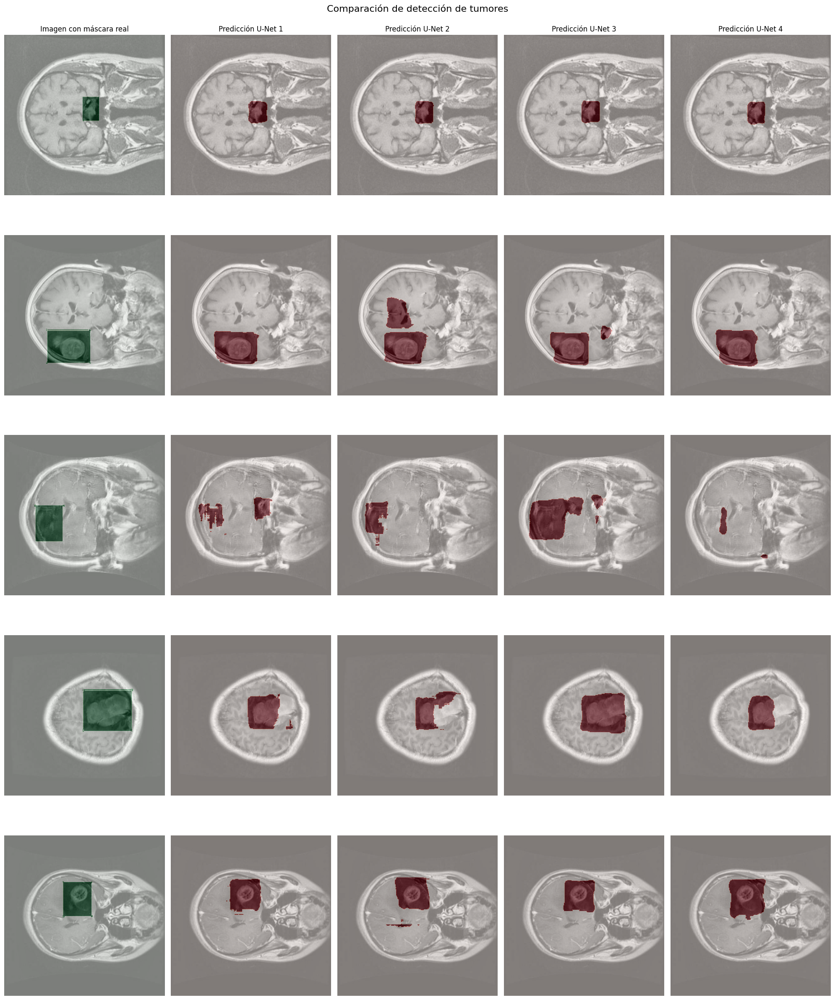

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import random

test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
# Generador de datos de prueba
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 1, (256,256))

# Obtener índices aleatorios
random_indices = random.sample(range(len(test_gen)), 5)

# Crear figura
fig, axes = plt.subplots(5, 5, figsize=(20, 25))
fig.suptitle('Comparación de detección de tumores', fontsize=16)

modelos = [u_net_1, u_net_2, u_net_3, u_net_4]
titulos = ['Imagen con máscara real', 'Predicción U-Net 1', 'Predicción U-Net 2', 'Predicción U-Net 3', 'Predicción U-Net 4']

# Establecer títulos de columnas
for ax, titulo in zip(axes[0], titulos):
    ax.set_title(titulo)

# Mostrar imágenes y predicciones
for row, idx in enumerate(random_indices):
    # Obtener imagen y máscara real
    image, true_mask = test_gen[idx]
    
    # Mostrar imagen original y superponer la máscara real
    axes[row, 0].imshow(image[0])
    axes[row, 0].imshow(true_mask[0, ..., 0], cmap='Greens', alpha=0.5)
    axes[row, 0].axis('off')
    
    # Obtener predicciones y mostrar
    for col, model in enumerate(modelos):
        pred_mask = model.predict(image, verbose=0)
        
        pred_mask = (pred_mask[0, ..., 0] > 0.5).astype('float32')
        
        # Mostrar imagen original y superponer la máscara predicha
        axes[row, col+1].imshow(image[0])
        axes[row, col+1].imshow(pred_mask, cmap='Reds', alpha=0.5)
        axes[row, col+1].axis('off')
        
plt.tight_layout()
plt.show()

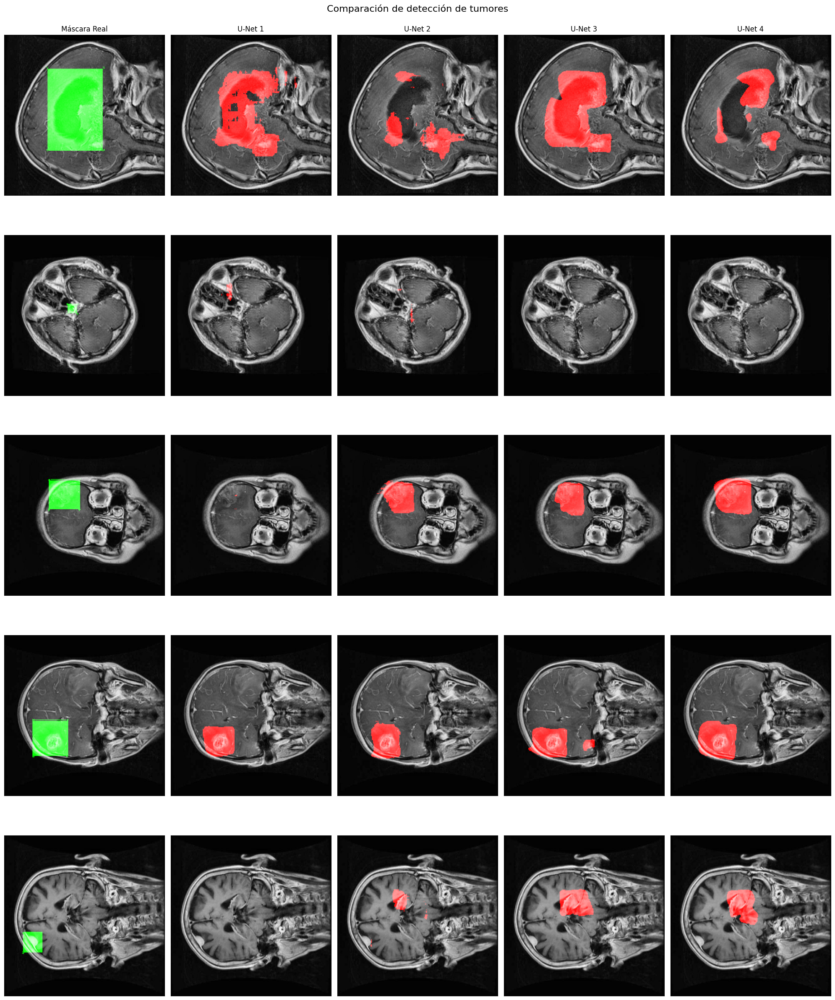

In [14]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Cargar modelos
models = [u_net_1, u_net_2, u_net_3, u_net_4]

# Crear figura
fig, axes = plt.subplots(5, 5, figsize=(20, 25))
fig.suptitle('Comparación de detección de tumores', fontsize=16)

# Títulos de columnas
titles = ['Máscara Real'] + [f'U-Net {i+1}' for i in range(4)]
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Obtener índices aleatorios
random_indices = random.sample(range(len(test_gen)), 5)

# Mostrar imágenes y predicciones
for row, idx in enumerate(random_indices):
    image, true_mask = test_gen[idx]
    image = image[0]
    true_mask = true_mask[0].astype('float32')
    
    # Máscara real en verde
    truth_overlay = image.copy()
    truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
    axes[row, 0].imshow(truth_overlay)
    
    # Predicciones de cada modelo en rojo
    for col, model in enumerate(models, 1):
        pred_mask = model.predict(image[np.newaxis, ...], verbose=0)
        pred_mask = (pred_mask[0] > 0.5).astype('float32')
        
        pred_overlay = image.copy()
        pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
        
        axes[row, col].imshow(pred_overlay)
    
    # Quitar ejes
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()

# Comparativa de U-Net y Yolo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

0: 256x256 (no detections), 9.0ms
Speed: 0.7ms preprocess, 9.0ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

0: 256x256 1 tumor, 9.6ms
Speed: 0.7ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

0: 256x256 3 tumors, 9.8ms
Speed: 0.7ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step

0: 256x256 1 

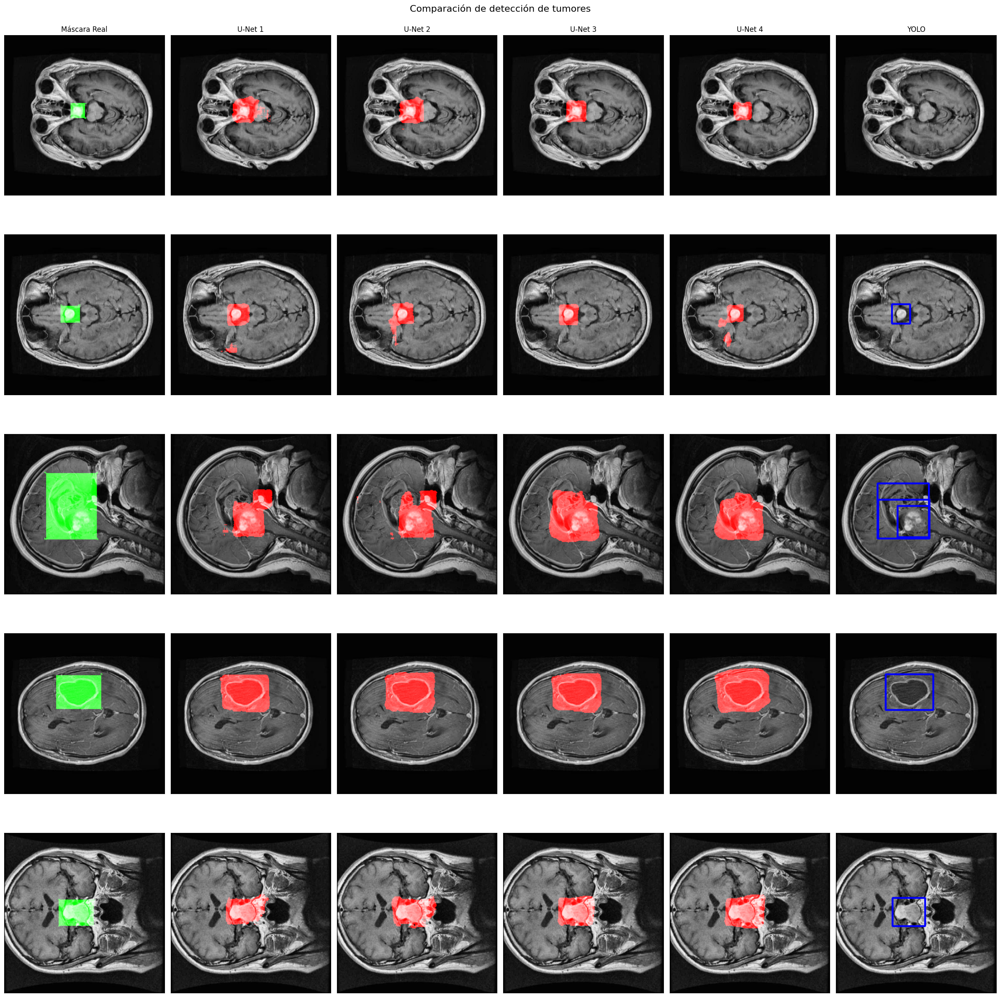

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import random
import cv2
from ultralytics import YOLO

# Cargar modelos
models = [u_net_1, u_net_2, u_net_3, u_net_4]
model_yolo = YOLO('/kaggle/input/runs-yolo/runs/detect/train/weights/best.pt')

# Crear figura
fig, axes = plt.subplots(5, 6, figsize=(24, 25))
fig.suptitle('Comparación de detección de tumores', fontsize=16)

# Títulos de columnas
titles = ['Máscara Real'] + [f'U-Net {i+1}' for i in range(4)] + ['YOLO']
for ax, title in zip(axes[0], titles):
    ax.set_title(title)

# Obtener índices aleatorios
random_indices = random.sample(range(len(test_gen)), 5)

# Mostrar imágenes y predicciones
for row, idx in enumerate(random_indices):
    image, true_mask = test_gen[idx]
    image = image[0]
    true_mask = true_mask[0].astype('float32')
    
    # Máscara real en verde
    truth_overlay = image.copy()
    truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
    axes[row, 0].imshow(truth_overlay)
    
    # Predicciones U-Net en rojo
    for col, model in enumerate(models, 1):
        pred_mask = model.predict(image[np.newaxis, ...])
        pred_mask = (pred_mask[0] > 0.5).astype('float32')
        
        pred_overlay = image.copy()
        pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
        
        axes[row, col].imshow(pred_overlay)
    
    # Predicción YOLO
    image_yolo = cv2.cvtColor((image * 255).astype('uint8'), cv2.COLOR_RGB2BGR)
    results = model_yolo.predict(image_yolo, imgsz=256, conf=0.5)
    yolo_overlay = image.copy()
    
    for r in results:
        boxes = r.boxes.xyxy.tolist()
        for box in boxes:
            x1, y1, x2, y2 = map(int, box[:4])
            cv2.rectangle(yolo_overlay, (x1, y1), (x2, y2), (0, 0, 255), 2)
    
    axes[row, 5].imshow(yolo_overlay)
    
    # Quitar ejes
    for ax in axes[row]:
        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout()
plt.show()

In [34]:
def visualize_predictions(num_images):
    """
    Visualiza las predicciones de los modelos U-Net y YOLO para un número específico de imágenes.
    
    Args:
        num_images (int): Número de imágenes aleatorias a visualizar
    """
    # Cargar modelos
    models = [u_net_1, u_net_2, u_net_3, u_net_4]
    model_yolo = YOLO('/kaggle/input/runs-yolo/runs/detect/train/weights/best.pt')

    # Crear figura
    fig, axes = plt.subplots(num_images, 6, figsize=(24, 5*num_images))
    fig.suptitle('Comparación de detección de tumores', fontsize=16)

    # Títulos de columnas
    titles = ['Máscara Real'] + [f'U-Net {i+1}' for i in range(4)] + ['YOLO']
    
    # Si solo hay una imagen, convertir axes en array 2D
    if num_images == 1:
        axes = axes.reshape(1, -1)
    
    for ax, title in zip(axes[0], titles):
        ax.set_title(title)

    # Obtener índices aleatorios
    random_indices = random.sample(range(len(test_gen)), num_images)

    # Mostrar imágenes y predicciones
    for row, idx in enumerate(random_indices):
        image, true_mask = test_gen[idx]
        image = image[0]
        true_mask = true_mask[0].astype('float32')
        
        # Máscara real en verde
        truth_overlay = image.copy()
        truth_overlay[..., 1] = np.maximum(truth_overlay[..., 1], true_mask[..., 0] * 255)
        axes[row, 0].imshow(truth_overlay)
        
        # Predicciones U-Net en rojo
        for col, model in enumerate(models, 1):
            pred_mask = model.predict(image[np.newaxis, ...])
            pred_mask = (pred_mask[0] > 0.5).astype('float32')
            
            pred_overlay = image.copy()
            pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)
            
            axes[row, col].imshow(pred_overlay)
        
        # Predicción YOLO
        image_yolo = cv2.cvtColor((image * 255).astype('uint8'), cv2.COLOR_RGB2BGR)
        results = model_yolo.predict(image_yolo, imgsz=256, conf=0.5)
        yolo_overlay = image.copy()
        
        for r in results:
            boxes = r.boxes.xyxy.tolist()
            for box in boxes:
                x1, y1, x2, y2 = map(int, box[:4])
                cv2.rectangle(yolo_overlay, (x1, y1), (x2, y2), (0, 0, 255), 2)
        
        axes[row, 5].imshow(yolo_overlay)
        
        # Quitar ejes
        for ax in axes[row]:
            ax.set_xticks([])
            ax.set_yticks([])

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step

0: 256x256 1 tumor, 9.0ms
Speed: 0.6ms preprocess, 9.0ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

0: 256x256 1 tumor, 9.1ms
Speed: 0.9ms preprocess, 9.1ms inference, 1.2ms postprocess per image at shape (1, 3, 256, 256)


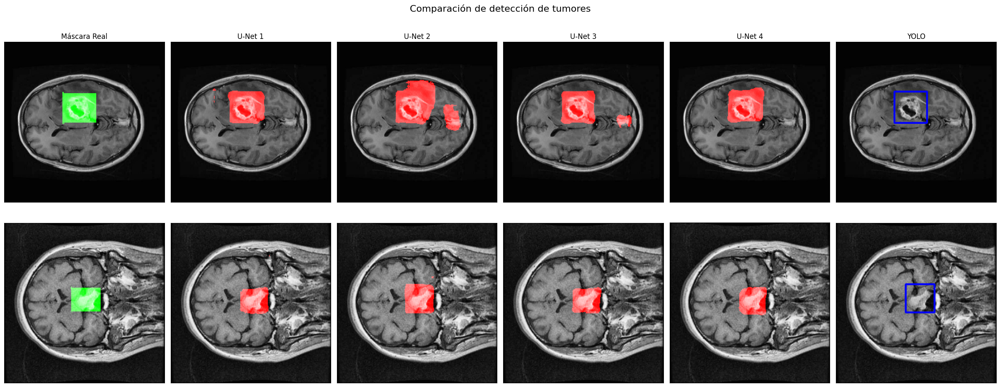

In [35]:
visualize_predictions(2)

In [59]:
models = [u_net_1, u_net_2, u_net_3, u_net_4]
u_net_1.evaluate(test_gen)
metrics = np.array([model.evaluate(test_gen) for model in models])
metrics

215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9752 - binary_io_u_2: 0.4938 - loss: 0.3912
215/215 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9752 - binary_io_u_2: 0.4938 - loss: 0.3912
215/215 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.9721 - binary_io_u_2: 0.4624 - loss: 0.4224
215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.9765 - binary_io_u_2: 0.5427 - loss: 0.3556
215/215 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.9746 - binary_io_u_2: 0.4972 - loss: 0.3918


array([[    0.38482,     0.97649,     0.50039],
       [    0.39634,     0.97392,     0.47823],
       [    0.33553,     0.97705,      0.5452],
       [    0.36219,     0.97606,      0.5215]])

In [60]:
import pandas as pd
metrics = pd.DataFrame(metrics, columns=['dice_loss', 'accuracy', 'IoU'], index=['u_net_256', 'u-net_528', 'u-net_1024', 'u-net_dropout'])

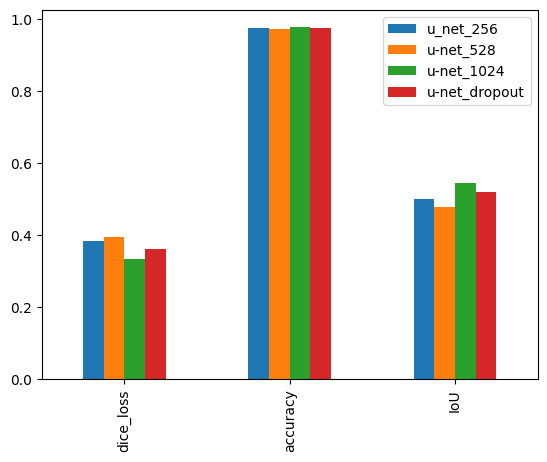

In [65]:
metrics.T.plot.bar();

In [9]:
from ultralytics import YOLO

def evaluate_yolo_model():
    """
    Evalúa el modelo YOLO usando el validador de ultralytics
    """
    # Cargar modelo
    model_yolo = YOLO('/kaggle/input/runs-yolo/runs/detect/train/weights/best.pt')
    
    # Ejecutar validación
    metrics = model_yolo.val(
        data='/kaggle/input/val-yolo/yolo_eval.yaml',  # Archivo de configuración de datos
        split='test',      # Conjunto de datos a evaluar
        imgsz=640,         # Tamaño de imagen
        conf=0.5,          # Umbral de confianza
        iou=0.5,          # Umbral de IoU      
    )   
    return metrics
# Ejecutar evaluación
metrics = evaluate_yolo_model()

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.50 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


100%|██████████| 755k/755k [00:00<00:00, 4.23MB/s]
val: Scanning /kaggle/working/dataset/labels/test... 215 images, 0 backgrounds, 0 corrupt: 100%|██████████| 215/215 [00:00<00:00, 1086.12it/s]


val: New cache created: /kaggle/working/dataset/labels/test.cache


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.26it/s]


                   all        215        215       0.87      0.809      0.865       0.52
Speed: 1.3ms preprocess, 2.7ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val


In [60]:
model.compile(optimizer = Adam(),
              loss = Dice(),
              metrics=['accuracy',binary_iou])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

0: 256x256 1 tumor, 10.6ms
Speed: 0.7ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

0: 256x256 1 tumor, 10.1ms
Speed: 1.0ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

0: 256x256 (no detections), 10.0ms
Speed: 0.6ms preprocess, 10.0ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

0: 256x256 1 tumor, 10.6ms
Speed: 1.0ms preprocess, 10.6ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step

0: 256x256 (no detections), 9.8ms
Speed: 0.6ms preprocess, 9.8ms inference, 0.6ms postprocess per image at shape (1, 3, 256, 256)


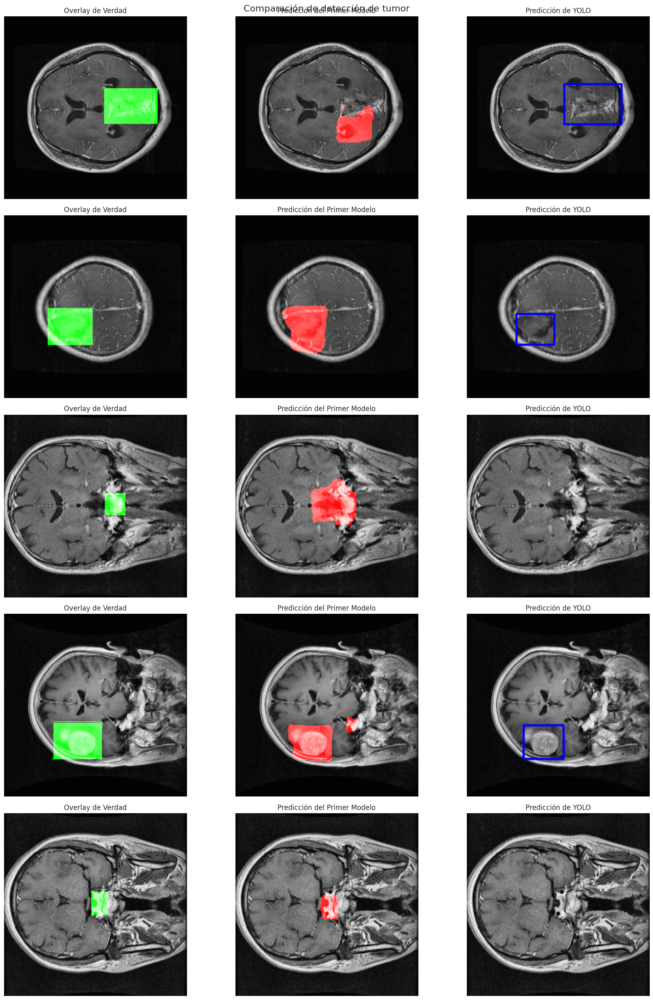

In [63]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
from ultralytics import YOLO

# Rutas a los modelos y datos
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
test_labels_path = '/kaggle/working/dataset/labels/test'

# Cargar modelos
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4, (256, 256))
model_unet = model  # Asumiendo que 'model' es tu primer modelo (por ejemplo, U-Net)
model_yolo = YOLO('runs/detect/train/weights/best.pt')

# Número de imágenes a mostrar
num_images = len(test_gen)
random_indices = random.sample(range(num_images), 5)

# Preparar subplots
fig, axes = plt.subplots(len(random_indices), 3, figsize=(18, 5 * len(random_indices)))
fig.suptitle('Comparación de detección de tumor', fontsize=16)

for row, idx in enumerate(random_indices):
    # Obtener imagen y máscara verdadera del generador
    image_input, true_mask = test_gen[idx]
    image = image_input[0]
    true_mask = true_mask[0].astype('float32')

    # Predicción del primer modelo (por ejemplo, U-Net)
    pred_mask = model_unet.predict(image_input)
    pred_mask = (pred_mask[0] > 0.5).astype('float32')

    # Preparar overlays para el primer modelo
    # Overlay de verdad (Verde)
    gt_overlay = image.copy()
    gt_overlay[..., 1] = np.maximum(gt_overlay[..., 1], true_mask[..., 0] * 255)

    # Overlay de predicción (Rojo)
    pred_overlay = image.copy()
    pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)

    # Predicción de YOLO
    image_yolo_input = cv2.cvtColor((image * 255).astype('uint8'), cv2.COLOR_RGB2BGR)
    results = model_yolo.predict(image_yolo_input, imgsz=256, conf=0.5)
    yolo_overlay = image.copy()

    for r in results:
        boxes = r.boxes.xyxy.tolist()
        for box in boxes:
            x1, y1, x2, y2 = map(int, box[:4])
            cv2.rectangle(yolo_overlay, (x1, y1), (x2, y2), (0, 0, 255), 2)  # Azul para predicciones de YOLO

    # Mostrar imágenes
    axes[row, 0].imshow(gt_overlay)
    axes[row, 0].set_title('Overlay de Verdad')
    axes[row, 0].axis('off')

    axes[row, 1].imshow(pred_overlay)
    axes[row, 1].set_title('Predicción del Primer Modelo')
    axes[row, 1].axis('off')

    axes[row, 2].imshow(yolo_overlay)
    axes[row, 2].set_title('Predicción de YOLO')
    axes[row, 2].axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

0: 256x256 1 tumor, 11.1ms
Speed: 0.7ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

0: 256x256 1 tumor, 10.8ms
Speed: 0.9ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

0: 256x256 1 tumor, 9.7ms
Speed: 0.9ms preprocess, 9.7ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step

0: 256x256 1 tumor, 9.6ms
Speed: 1.0ms preprocess, 9.6ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 256)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

0: 256x256 (no detections), 10.7ms
Speed: 1.1ms preprocess, 10.7ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 256)


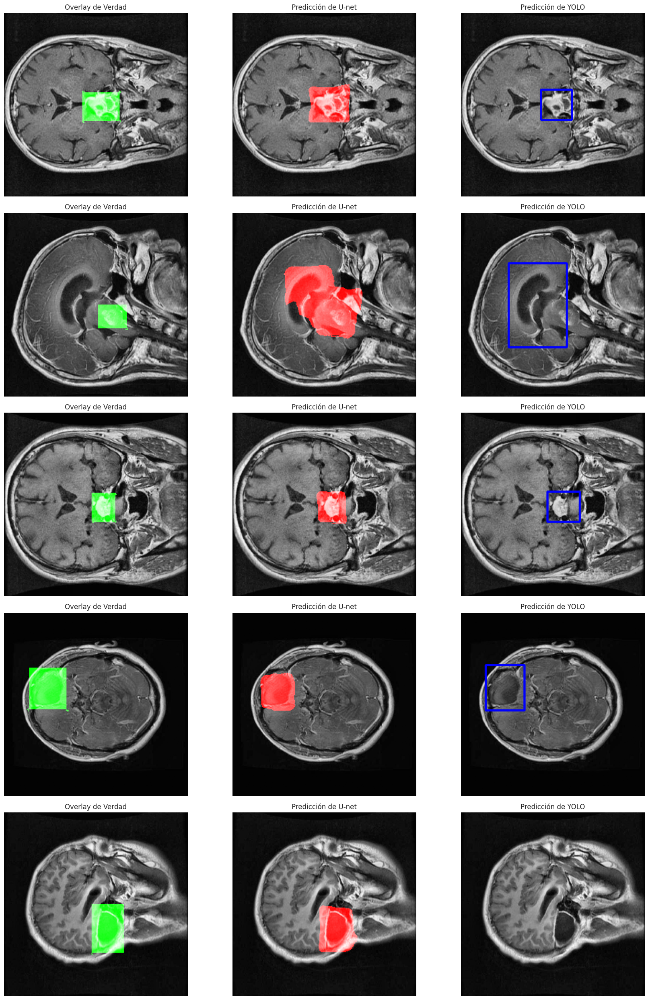

In [65]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
from ultralytics import YOLO

# Rutas a los modelos y datos
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
test_labels_path = '/kaggle/working/dataset/labels/test'

# Cargar modelos
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4, (256, 256))
model_unet = model  # Asumiendo que 'model' es tu primer modelo (por ejemplo, U-Net)
model_yolo = YOLO('runs/detect/train/weights/best.pt')

# Número de imágenes a mostrar
num_images = len(test_gen)
random_indices = random.sample(range(num_images), 5)

# Preparar subplots
fig, axes = plt.subplots(len(random_indices), 3, figsize=(18, 5 * len(random_indices)))

for row, idx in enumerate(random_indices):
    # Obtener imagen y máscara verdadera del generador
    image_input, true_mask = test_gen[idx]
    image = image_input[0]
    true_mask = true_mask[0].astype('float32')

    # Predicción del primer modelo (por ejemplo, U-Net)
    pred_mask = model_unet.predict(image_input)
    pred_mask = (pred_mask[0] > 0.5).astype('float32')

    # Preparar overlays para el primer modelo
    # Overlay de verdad (Verde)
    gt_overlay = image.copy()
    gt_overlay[..., 1] = np.maximum(gt_overlay[..., 1], true_mask[..., 0] * 255)

    # Overlay de predicción (Rojo)
    pred_overlay = image.copy()
    pred_overlay[..., 0] = np.maximum(pred_overlay[..., 0], pred_mask[..., 0] * 255)

    # Predicción de YOLO
    image_yolo_input = cv2.cvtColor((image * 255).astype('uint8'), cv2.COLOR_RGB2BGR)
    results = model_yolo.predict(image_yolo_input, imgsz=256, conf=0.5)
    yolo_overlay = image.copy()

    for r in results:
        boxes = r.boxes.xyxy.tolist()
        for box in boxes:
            x1, y1, x2, y2 = map(int, box[:4])
            cv2.rectangle(yolo_overlay, (x1, y1), (x2, y2), (0, 0, 255), 2)  # Azul para predicciones de YOLO

    # Mostrar imágenes
    axes[row, 0].imshow(gt_overlay)
    axes[row, 0].set_title('Overlay de Verdad')
    axes[row, 0].axis('off')

    axes[row, 1].imshow(pred_overlay)
    axes[row, 1].set_title('Predicción de U-net')
    axes[row, 1].axis('off')

    axes[row, 2].imshow(yolo_overlay)
    axes[row, 2].set_title('Predicción de YOLO')
    axes[row, 2].axis('off')

plt.tight_layout()
plt.show()

In [51]:
import numpy as np
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
# Generador de datos de prueba
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4, (256,256))
# Función para calcular el IoU
def compute_iou(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    iou = np.sum(intersection) / np.sum(union)
    return iou

# Función para calcular el AP en un umbral de IoU dado
def calculate_ap(y_true_list, y_pred_list, iou_threshold=0.5):
    iou_scores = []
    for y_true, y_pred in zip(y_true_list, y_pred_list):
        iou = compute_iou(y_true, y_pred)
        iou_scores.append(iou)

    iou_scores = np.array(iou_scores)
    true_positives = iou_scores >= iou_threshold
    false_positives = iou_scores < iou_threshold

    tp_cumsum = np.cumsum(true_positives)
    fp_cumsum = np.cumsum(false_positives)
    precisions = tp_cumsum / (tp_cumsum + fp_cumsum)

    ap = np.sum(precisions * true_positives) / np.sum(true_positives)
    return ap

# Lista de modelos y nombres
models = [u_net_1, u_net_2, u_net_3, u_net_4]
model_names = ['u_net_1', 'u_net_2', 'u_net_3', 'u_net_4']

# Evaluación de cada modelo
for model, name in zip(models, model_names):
    y_true_list = []
    y_pred_list = []

    for i in range(len(test_gen)):
        x_batch, y_batch = test_gen[i]
        y_pred_batch = model.predict(x_batch, verbose=0)
        y_pred_batch = (y_pred_batch > 0.5).astype(np.uint8)

        y_true_list.extend(y_batch)
        y_pred_list.extend(y_pred_batch)

    ap = calculate_ap(y_true_list, y_pred_list, iou_threshold=0.5)
    print(f"Model {name} Average Precision at IoU 0.5: {ap}")

/tmp/ipykernel_23/907415656.py:10: RuntimeWarning: invalid value encountered in scalar divide
  iou = np.sum(intersection) / np.sum(union)


Model u_net_1 Average Precision at IoU 0.5: 0.6184857871583057
Model u_net_2 Average Precision at IoU 0.5: 0.5623380144972903
Model u_net_3 Average Precision at IoU 0.5: 0.6514200271668997
Model u_net_4 Average Precision at IoU 0.5: 0.6244798327395872


In [50]:
import numpy as np
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
# Generador de datos de prueba
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 4, (256,256))
def calculate_iou(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    if np.sum(union) == 0:
        return 1.0  # Caso especial si ambos son vacíos
    iou = np.sum(intersection) / np.sum(union)
    return iou

def calculate_map(model, data_generator, iou_threshold=0.5):
    iou_scores = []
    for i in range(len(data_generator)):
        images, masks_true = data_generator[i]
        masks_pred = model.predict(images, verbose=0)
        masks_pred = (masks_pred > 0.5).astype(np.uint8)
        for mask_true, mask_pred in zip(masks_true, masks_pred):
            iou = calculate_iou(mask_true.squeeze(), mask_pred.squeeze())
            iou_scores.append(iou)
    iou_scores = np.array(iou_scores)
    tp = np.sum(iou_scores >= iou_threshold)
    fp = np.sum(iou_scores < iou_threshold)
    fn = 0  # Suponiendo que no hay falsos negativos adicionales
    precision = tp / (tp + fp)
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    ap = precision  # En este caso, AP es igual a la precisión
    return ap

# Uso del cálculo de mAP

mAP = calculate_map(u_net_3, test_gen, iou_threshold=0.5)
print("mAP:", mAP)

mAP: 0.6944444444444444


In [ ]:
from ultralytics import YOLO
import numpy as np

# 1. Cargar el modelo
model_yolo = YOLO('runs/detect/train/weights/best.pt') # Reemplaza con la ruta a tu modelo

def calculate_iou(pred_boxes, true_boxes):
    """
    Calcula el IoU entre las cajas predichas y las verdaderas
    pred_boxes: array de forma (N, 4) con formato [x1, y1, x2, y2]
    true_boxes: array de forma (M, 4) con formato [x1, y1, x2, y2]
    """
    def box_area(box):
        return (box[2] - box[0]) * (box[3] - box[1])
    
    ious = []
    for pred_box in pred_boxes:
        for true_box in true_boxes:
            # Calcular intersección
            x1 = max(pred_box[0], true_box[0])
            y1 = max(pred_box[1], true_box[1])
            x2 = min(pred_box[2], true_box[2])
            y2 = min(pred_box[3], true_box[3])
            
            intersection = max(0, x2 - x1) * max(0, y2 - y1)
            
            # Calcular unión
            pred_area = box_area(pred_box)
            true_area = box_area(true_box)
            union = pred_area + true_area - intersection
            
            # Calcular IoU
            iou = intersection / union if union > 0 else 0
            ious.append(iou)
    
    return np.mean(ious) if ious else 0

# 2. Realizar predicción y calcular IoU
def evaluate_model(model, val_loader):
    total_iou = 0
    num_samples = 0
    
    for i in range(len(val_loader)):
        images, labels = batch[i]
        
        # Realizar predicciones
        results = model(images)
        
        for result, label in zip(results, labels):
            pred_boxes = result.boxes.xyxy.cpu().numpy()  # Convertir a numpy
            true_boxes = label[:, 1:5].cpu().numpy()  # Asumiendo formato YOLO
            
            # Calcular IoU para esta imagen
            iou = calculate_iou(pred_boxes, true_boxes)
            total_iou += iou
            num_samples += 1
    
    # Calcular IoU promedio
    mean_iou = total_iou / num_samples if num_samples > 0 else 0
    return mean_iou

# 3. Usar la función
# val_loader debe ser tu DataLoader de validación
mean_iou = evaluate_model(model_yolo, )
print(f"IoU promedio: {mean_iou:.4f}")

In [15]:
test_mask_path = '/kaggle/working/test_masks/'
test_image_path = '/kaggle/input/brain-tumor-image-dataset-semantic-segmentation/test/'
test_gen = DataGen(test_image_path, test_mask_path, test_annotations, 1, (256,256))
def iou(model, test_gen):
    metric = []
    for i in range(len(test_gen)):
        image, mask = test_gen[i]
        pred = (model.predict(image, verbose = 0) > 0.5).astype(int)
        intersect = np.sum(np.logical_and(mask, pred))
        union = np.sum(np.logical_or(mask, pred))
        metric.append(intersect / union)
    return np.array(metric)
models = [u_net_1, u_net_2, u_net_3, u_net_4]
mAP_u_net = [np.mean(iou(model, test_gen) > 0.3) for model in models]
mAP_u_net.append(0.865)

In [16]:
mAP_u_net

[0.7674418604651163,
 0.772093023255814,
 0.813953488372093,
 0.7813953488372093,
 0.865]

In [87]:
import pandas as pd
df = pd.Series(np.array(mAP_u_net), index=['u_net_256', 'u-net_528', 'u-net_1024', 'u-net_dropout', 'yolo'])
df

u_net_256        0.618605
u-net_528        0.576744
u-net_1024       0.693023
u-net_dropout    0.646512
yolo             0.865000
dtype: float64

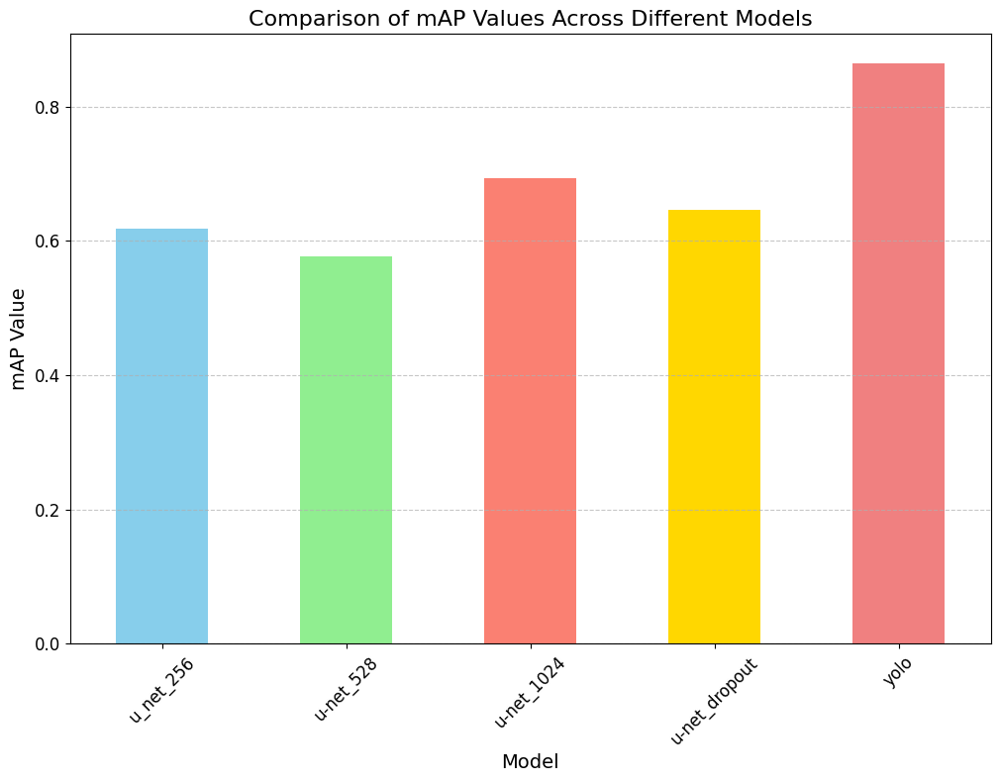

In [91]:
df.plot(kind='bar', figsize=(12, 8), color=['skyblue', 'lightgreen', 'salmon', 'gold', 'lightcoral'])
plt.title('Comparison of mAP Values Across Different Models', fontsize=16)
plt.xlabel('Model', fontsize=14)
plt.ylabel('mAP Value', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()